In [ ]:
# INSTALL & IMPORTS
!pip install imread --quiet
!pip install scikit-learn --quiet
!pip install seaborn --quiet
!pip install tensorflow --quiet

import os
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Nadam
from tensorflow.keras import layers, models

from google.colab import drive

print("TensorFlow version:", tf.__version__)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 55.8 MB/s eta 0:00:00
TensorFlow version: 2.18.0


In [ ]:
# MOUNT DRIVE & DEFINE PATHS

drive.mount('/content/drive', force_remount=True)

dataset_path = "/content/drive/MyDrive/cassava_dataset"
image_dir    = os.path.join(dataset_path, "train_images")
csv_file     = os.path.join(dataset_path, "train.csv")

print("CSV exists:", os.path.exists(csv_file))
print("Image folder exists:", os.path.exists(image_dir))

Mounted at /content/drive
CSV exists: True
Image folder exists: True


In [ ]:
#LOAD & PREPARE DATAFRAME
train_df = pd.read_csv(csv_file)
train_df['label'] = train_df['label'].astype(str)

# Human-readable mapping for class names
disease_names = {
    "0": "CBB",    # Cassava Bacterial Blight
    "1": "CBSD",   # Cassava Brown Streak Disease
    "2": "CGM",    # Cassava Green Mottle
    "3": "CMD",    # Cassava Mosaic Disease
    "4": "Healthy"
}

print("Total samples:", len(train_df))
print(train_df.head())

Total samples: 21397
         image_id label
0  1000015157.jpg     0
1  1000201771.jpg     3
2   100042118.jpg     1
3  1000723321.jpg     1
4  1000812911.jpg     3


In [ ]:
# Define paths
dataset_path = "/content/drive/MyDrive/cassava_dataset"
image_dir    = os.path.join(dataset_path, "train_images")
csv_file     = os.path.join(dataset_path, "train.csv")

# Load train.csv
df = pd.read_csv(csv_file)

# Get lists of image names
csv_images = set(df['image_id'])  # Images listed in CSV
folder_images = set(os.listdir(image_dir))  # Images in train_images folder

# Identify missing and extra images
missing_images = csv_images - folder_images  # In CSV but not in folder
extra_images = folder_images - csv_images  # In folder but not in CSV

# Print results
print(f"Total images in CSV: {len(csv_images)}")
print(f"Total images in folder: {len(folder_images)}")
print(f"Missing images (in CSV but not in folder): {len(missing_images)}")
print(f"Extra images (in folder but not in CSV): {len(extra_images)}")

Total images in CSV: 21397
Total images in folder: 17938
Missing images (in CSV but not in folder): 3459
Extra images (in folder but not in CSV): 0


In [ ]:
# Remove rows in df where images are missing
df = df[~df['image_id'].isin(missing_images)]

# Save cleaned CSV
cleaned_csv_path = "/content/drive/MyDrive/cassava_dataset/train_cleaned.csv"
df.to_csv(cleaned_csv_path, index=False)

print(f"Updated dataset size: {len(df)}")


Updated dataset size: 17938


In [ ]:
# Check for missing values
missing_values = train_df.isnull().sum()

# Print the count of missing values for each column
print("Missing values per column:")
print(missing_values)

Missing values per column:
image_id    0
label       0
dtype: int64


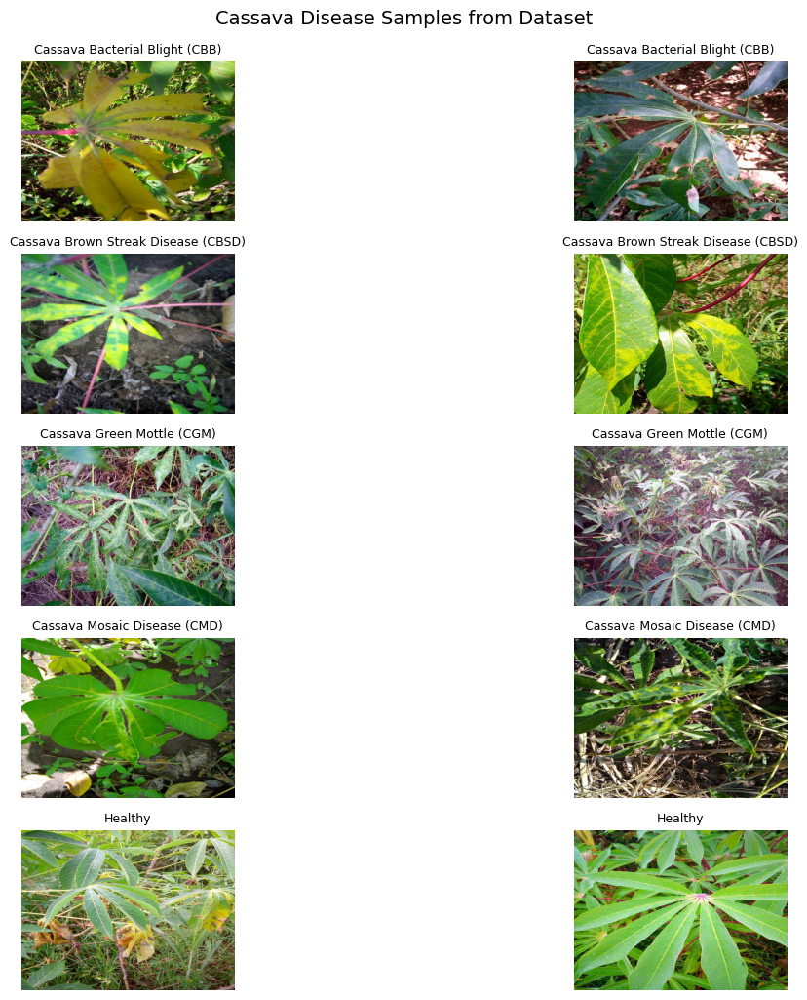

In [ ]:
import matplotlib.pyplot as plt
import os
import numpy as np
from PIL import Image

# Define your label mapping
label_to_disease = {
    0: "Cassava Bacterial Blight (CBB)",
    1: "Cassava Brown Streak Disease (CBSD)",
    2: "Cassava Green Mottle (CGM)",
    3: "Cassava Mosaic Disease (CMD)",
    4: "Healthy"
}

# Create a figure to display samples
plt.figure(figsize=(15, 10))

# Select samples - 2 per class for balanced view
samples_per_class = 2
for class_id, disease_name in label_to_disease.items():

    class_samples = df[df['label'] == class_id].sample(samples_per_class)

    for i, (_, row) in enumerate(class_samples.iterrows()):

        img_path = os.path.join(image_dir, row['image_id'])
        try:
            img = Image.open(img_path)

            # Create subplot
            plt.subplot(len(label_to_disease), samples_per_class,
                       class_id * samples_per_class + i + 1)
            plt.imshow(img)
            plt.title(f"{disease_name}", fontsize=9)
            plt.axis('off')

        except Exception as e:
            print(f"Error loading {img_path}: {e}")

plt.tight_layout()
plt.suptitle("Cassava Disease Samples from Dataset", y=1.02, fontsize=14)
plt.savefig('disease_samples.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# Filter dataframe to only include existing images
valid_images = train_df[train_df['image_id'].isin(os.listdir(image_dir))].copy()

#  STRATIFIED SPLIT INTO train_raw & val_df
train_raw, val_df = train_test_split(
    valid_images,  # Use the filtered dataframe
    test_size=0.20,
    stratify=valid_images['label'],
    random_state=42
)

print("Actual available training samples:", len(train_raw))
print("Actual available validation samples:", len(val_df))


Actual available training samples: 14350
Actual available validation samples: 3588


Unbalanced class distribution (train_raw):
label
3    8821
4    1733
2    1594
1    1465
0     737
Name: count, dtype: int64


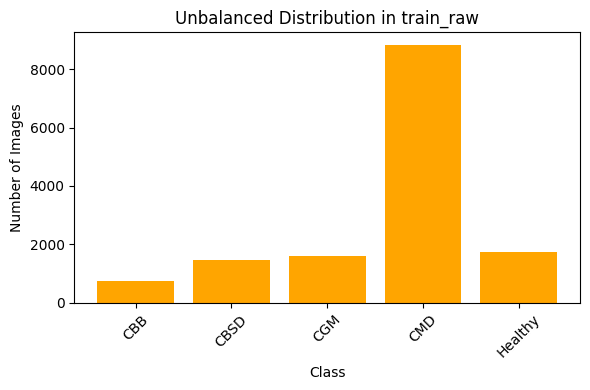

In [ ]:
#  PRINT & PLOT UNBALANCED train_raw
print("Unbalanced class distribution (train_raw):")
print(train_raw['label'].value_counts())

plt.figure(figsize=(6,4))
counts_raw = train_raw['label'].value_counts().sort_index() #calculate the count of each label again, but this time it sort by class index to ensure the order is consistent
labels_raw = [disease_names[lbl] for lbl in counts_raw.index] # replaces the numeric class labels with human-readable names
plt.bar(labels_raw, counts_raw.values, color='orange')
plt.title("Unbalanced Distribution in train_raw")
plt.ylabel("Number of Images")
plt.xlabel("Class")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
#  BALANCE train_raw BY OVERSAMPLING
class_counts = train_raw['label'].value_counts() # tells which classes have fewer samples and which have more
max_count = class_counts.max() # find the maximum number of samples among all the classes

balanced_dfs = []
# oversampling
for cls, cnt in class_counts.items():
    cls_df = train_raw[train_raw['label'] == cls] # Select all samples of this class
    if cnt == max_count:
        balanced_dfs.append(cls_df) # If already max size, keep as is
    else:
        oversampled = cls_df.sample(max_count, replace=True, random_state=42) # Sample with replacement to reach max_count
        balanced_dfs.append(oversampled)

train_balanced = pd.concat(balanced_dfs).reset_index(drop=True) #Combines all the individual oversampled class DataFrames into a single balanced DataFrame.
train_balanced = train_balanced.sample(frac=1.0, random_state=42).reset_index(drop=True) #resets the index to avoid duplicated or missing indices


Balanced class distribution (train_balanced):
label
2    8821
1    8821
3    8821
0    8821
4    8821
Name: count, dtype: int64


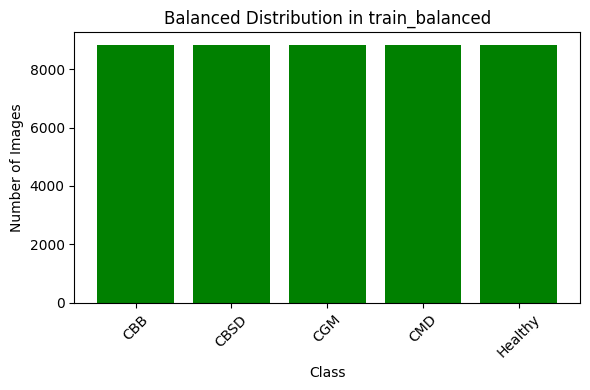

In [ ]:
#  PRINT & PLOT BALANCED train_balanced
print("\nBalanced class distribution (train_balanced):")
print(train_balanced['label'].value_counts())

plt.figure(figsize=(6,4))
counts_bal = train_balanced['label'].value_counts().sort_index()
labels_bal = [disease_names[lbl] for lbl in counts_bal.index]
plt.bar(labels_bal, counts_bal.values, color='green')
plt.title("Balanced Distribution in train_balanced")
plt.ylabel("Number of Images")
plt.xlabel("Class")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

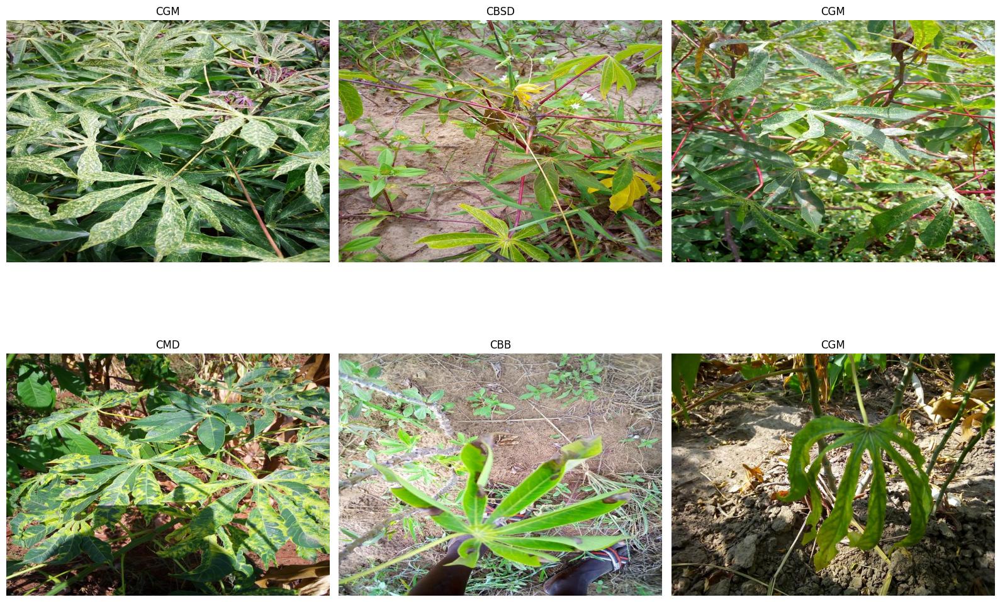

In [ ]:
#   Visualizing sample images befor augmentation
plt.figure(figsize=(16, 12))
shown = 0 #counts how many images displayed so far.
i = 0  #index to loop through the dataframe.
while shown < 6 and i < len(train_balanced):
    img_path = os.path.join(image_dir, train_balanced.iloc[i]['image_id'])
    if os.path.exists(img_path):
        plt.subplot(2, 3, shown + 1)
        img = Image.open(img_path)
        plt.imshow(np.array(img))
        lbl = train_balanced.iloc[i]['label']
        plt.title(disease_names[lbl])
        plt.axis('off')
        shown += 1   # is increased only when a valid image is displayed
    i += 1   #is always incremented to move to the next row in the dataframe.
plt.tight_layout()
plt.show()

In [ ]:
#  CHECK IMAGE SIZES IN train_balanced
sizes = []
for i in range(0, len(train_balanced), 250):
    path = os.path.join(image_dir, train_balanced.iloc[i]['image_id'])
    if os.path.exists(path):
        img = Image.open(path)
        sizes.append(np.array(img).shape)
print("Unique image sizes (sample every 250th):", set(sizes))

Unique image sizes (sample every 250th): {(600, 800, 3)}


In [ ]:
#  CREATE IMAGE GENERATORS
IMG_W, IMG_H = 150, 150  # Model input dimensions

train_datagen = ImageDataGenerator(
    rescale=1./255, #normalizes pixel values from 0–255 to a range of 0–1, which helps the model train better.
    rotation_range=40, #Randomly rotates images up to 40 degrees.
    zoom_range=0.2, #Random zoom in or out by 20%.
    width_shift_range=0.1, #Randomly shift the image horizontally or vertically by 10%.
    height_shift_range=0.1,
    shear_range=0.1, #Applies random shearing transformation.
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest' #Fills in new pixels that may be created during transformation using the nearest pixel value.
)

val_datagen = ImageDataGenerator(rescale=1./255)

#Load Augmented Training Data From DataFrame
train_gen = train_datagen.flow_from_dataframe(
    dataframe=train_balanced,
    directory=image_dir,
    x_col='image_id',
    y_col='label',
    target_size=(IMG_W, IMG_H),
    batch_size=64,
    class_mode='categorical',
    shuffle=True
)
#Load Validation Data Without Augmentation
val_gen = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    directory=image_dir,
    x_col='image_id',
    y_col='label',
    target_size=(IMG_W, IMG_H),
    batch_size=64,
    class_mode='categorical',
    shuffle=False
)

Found 44105 validated image filenames belonging to 5 classes.
Found 3588 validated image filenames belonging to 5 classes.


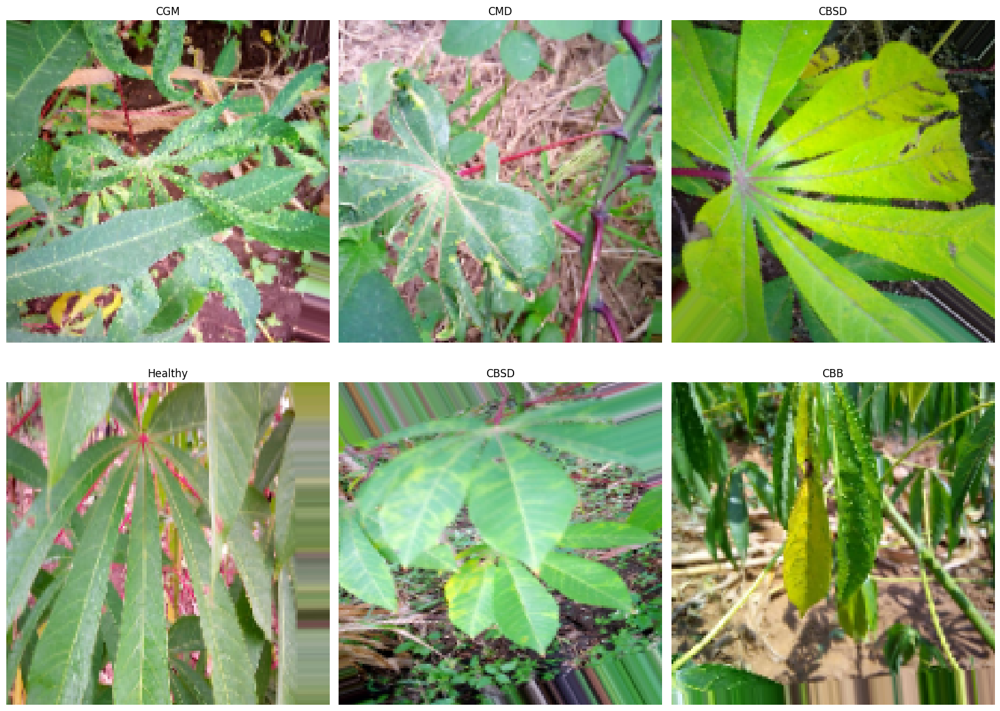

In [ ]:
# VISUALIZING AUGMENTED SAMPLES FOR CUSTOM CNN
plt.figure(figsize=(16, 12))
shown = 0
# Select some indices from the balanced training dataframe
sample_indices = train_balanced.sample(6, random_state=42).index.tolist()

while shown < 6:
    # Get the image and label using the generator's __getitem__
    img_batch, label_batch = train_gen[shown]
    img = img_batch[0]
    label_one_hot = label_batch[0] # This is a one-hot encoded vector

    # Convert the one-hot label back to an integer class
    label_index = np.argmax(label_one_hot)


    inv_class_indices = {v: k for k, v in train_gen.class_indices.items()}
    class_string_label = inv_class_indices[label_index]
    human_label = disease_names[class_string_label]

    plt.subplot(2, 3, shown + 1)
    # ImageDataGenerator rescales pixels to 0-1, so no further normalization needed for display
    plt.imshow(img)
    plt.title(human_label)
    plt.axis('off')
    shown += 1

plt.tight_layout()
plt.show()

In [ ]:

#  BUILD A SINGLE CNN MODEL
model = models.Sequential([
    # Block 1
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(IMG_W, IMG_H, 3)),
    layers.MaxPooling2D(pool_size=(2,2)),
    layers.BatchNormalization(),

    # Block 2
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D(pool_size=(2,2)),
    layers.BatchNormalization(),
    layers.Dropout(0.25),

    # Block 3
    layers.Conv2D(128, (3,3), activation='relu'),
    layers.MaxPooling2D(pool_size=(2,2)),
    layers.BatchNormalization(),
    layers.Dropout(0.25),

    # Flatten & Dense
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(5, activation='softmax')  # 5 classes
])

model.compile(
    loss='categorical_crossentropy',
    optimizer=Nadam(learning_rate=0.001),
    metrics=['accuracy']
)

model.summary()

# SET CALLBACKS
reduce_lr = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.3,
    patience=5,
    min_lr=1e-5,
    verbose=1
)

#  TRAIN THE MODEL
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    callbacks=[ reduce_lr],
    verbose=1
)

# SAVE THE TRAINED MODEL
model.save('cassava_cnn_balanced.h5')
print("Model saved as cassava_cnn_balanced.h5")





/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 74, 74, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 36, 36, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 17, 17, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    18,940,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,037,125 (72.62 MB)

 Trainable params: 19,036,677 (72.62 MB)

 Non-trainable params: 448 (1.75 KB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
687/687 ━━━━━━━━━━━━━━━━━━━━ 4512s 7s/step - accuracy: 0.3061 - loss: 2.7591 - val_accuracy: 0.2542 - val_loss: 1.6435 - learning_rate: 0.0010
Epoch 2/30
687/687 ━━━━━━━━━━━━━━━━━━━━ 525s 744ms/step - accuracy: 0.4196 - loss: 1.3557 - val_accuracy: 0.2987 - val_loss: 1.6606 - learning_rate: 0.0010
Epoch 3/30
687/687 ━━━━━━━━━━━━━━━━━━━━ 515s 750ms/step - accuracy: 0.4784 - loss: 1.2701 - val_accuracy: 0.5506 - val_loss: 1.1292 - learning_rate: 0.0010
Epoch 4/30
687/687 ━━━━━━━━━━━━━━━━━━━━ 514s 749ms/step - accuracy: 0.5082 - loss: 1.2151 - val_accuracy: 0.5706 - val_loss: 1.0660 - learning_rate: 0.0010
Epoch 5/30
687/687 ━━━━━━━━━━━━━━━━━━━━ 511s 743ms/step - accuracy: 0.5331 - loss: 1.1705 - val_accuracy: 0.6129 - val_loss: 1.0728 - learning_rate: 0.0010
Epoch 6/30
687/687 ━━━━━━━━━━━━━━━━━━━━ 522s 760ms/step - accuracy: 0.5524 - loss: 1.1294 - val_accuracy: 0.7013 - val_loss: 0.8482 - learning_rate: 0.0010
Epoch 7/30
687/687 ━━━━━━━━━━━━━━━━━━━━ 556s 752ms/step - accuracy

Model saved as cassava_cnn_balanced.h5


In [ ]:
#  PRINT FINAL VALIDATION ACCURACY ==========
final_val_accuracy = history.history['val_accuracy'][-1]
print(f"\nFinal Validation Accuracy after training: {final_val_accuracy * 100:.2f}%")


Final Validation Accuracy after training: 76.59%


In [ ]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Define save path in Google Drive
save_path = '/content/drive/MyDrive/cassava_cnn_balanced.h5'

# Create directory if it doesn't exist
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save the model
model.save(save_path)
print(f"Model saved to Google Drive at: {save_path}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model saved to Google Drive at: /content/drive/MyDrive/cassava_cnn_balanced.h5


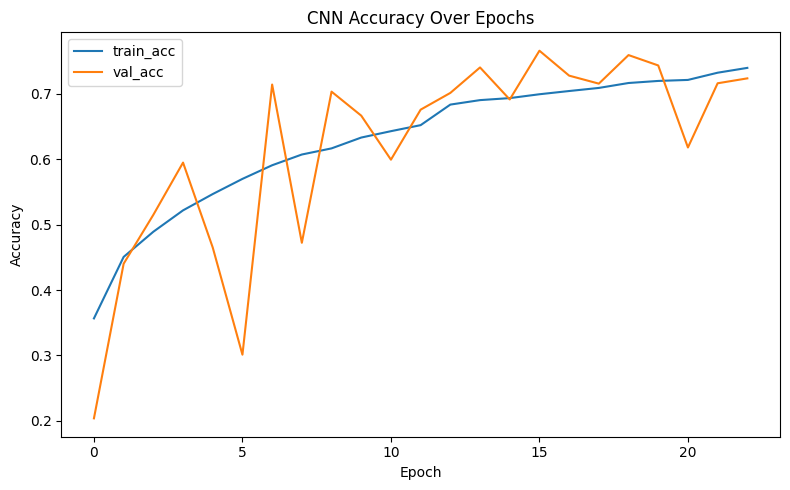

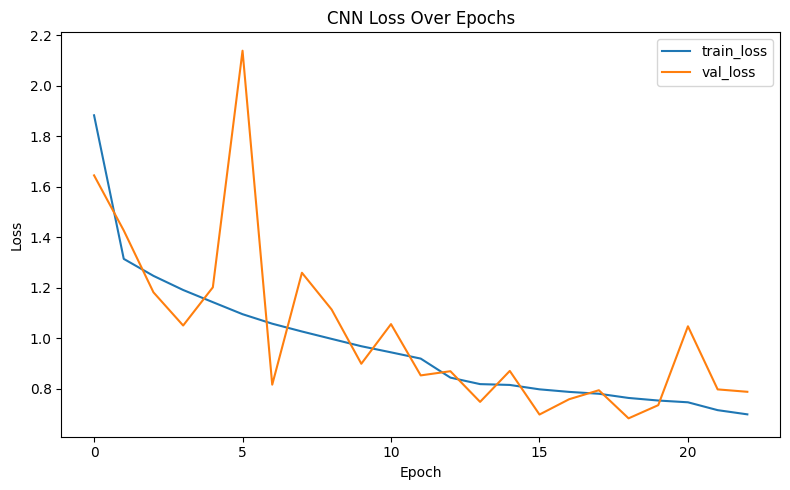

In [ ]:
# ========== PLOT TRAINING & VALIDATION ACCURACY / LOSS ==========
plt.figure(figsize=(8,5))
plt.plot(history.history['accuracy'], label='train_acc')
plt.plot(history.history['val_accuracy'], label='val_acc')
plt.title("CNN Accuracy Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(8,5))
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title("CNN Loss Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# ========== PREDICT ON VALIDATION SET ==========
val_gen.reset()
pred_probs = model.predict(val_gen, verbose=1)
y_pred = np.argmax(pred_probs, axis=1)
y_true = val_gen.labels

# ========== CLASSIFICATION REPORT (Precision, Recall, F1) ==========
inv_class_map = {v: k for k, v in val_gen.class_indices.items()}
class_labels = [inv_class_map[i] for i in range(len(inv_class_map))]
human_labels = [disease_names[label_str] for label_str in class_labels]

print("Classification Report on Validation Set:\n")
print(
    classification_report(
        y_true,
        y_pred,
        labels=list(range(len(class_labels))),
        target_names=human_labels,
        digits=4
    )
)


57/57 ━━━━━━━━━━━━━━━━━━━━ 22s 375ms/step
Classification Report on Validation Set:

              precision    recall  f1-score   support

         CBB     0.5469    0.3684    0.4403       190
        CBSD     0.6550    0.6137    0.6337       365
         CGM     0.5496    0.7094    0.6194       406
         CMD     0.9523    0.8442    0.8950      2201
     Healthy     0.4823    0.7235    0.5788       434

    accuracy                         0.7659      3596
   macro avg     0.6372    0.6518    0.6334      3596
weighted avg     0.7985    0.7659    0.7752      3596



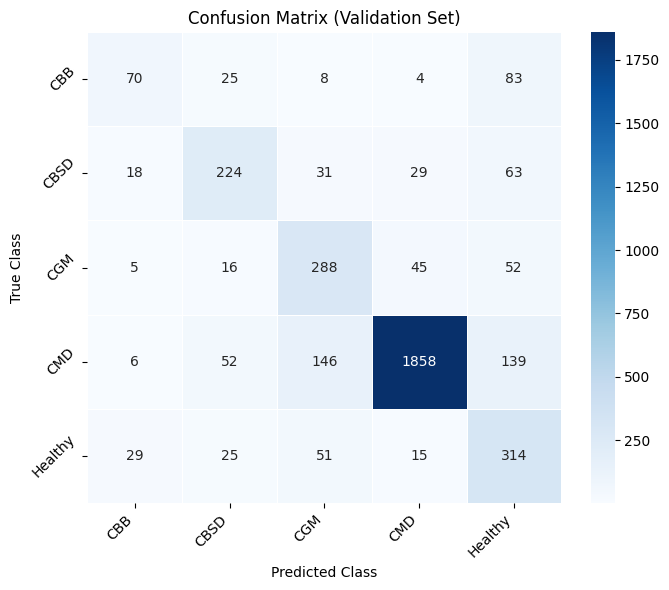

In [ ]:
# ========== CONFUSION MATRIX HEATMAP ==========
cm = confusion_matrix(y_true, y_pred, labels=list(range(len(class_labels))))

plt.figure(figsize=(7,6))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=human_labels,
    yticklabels=human_labels,
    linewidths=0.5
)
plt.ylabel("True Class")
plt.xlabel("Predicted Class")
plt.title("Confusion Matrix (Validation Set)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()


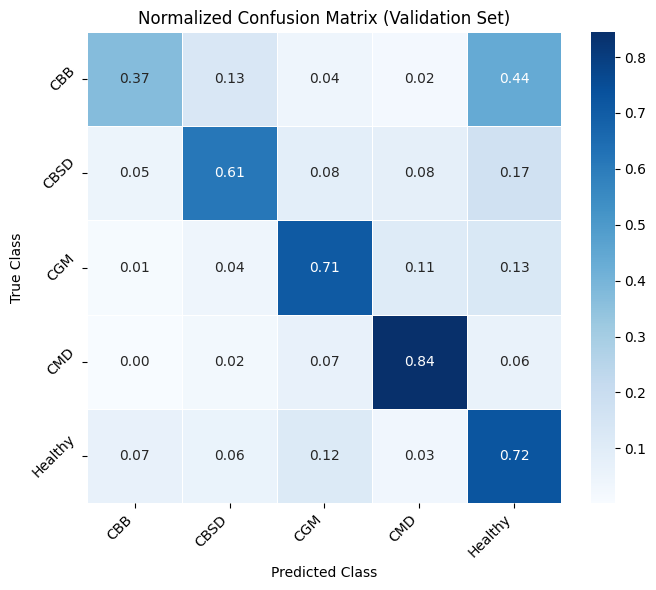

In [ ]:
# Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(7,6))
sns.heatmap(
    cm_normalized,
    annot=True,
    fmt=".2f", # Use .2f for floating point numbers with 2 decimal places
    cmap="Blues",
    xticklabels=human_labels,
    yticklabels=human_labels,
    linewidths=0.5
)
plt.ylabel("True Class")
plt.xlabel("Predicted Class")
plt.title("Normalized Confusion Matrix (Validation Set)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# example paths
/content/drive/MyDrive/cassava_dataset/train_images/1576606254.jpg
/content/drive/MyDrive/cassava_dataset/train_images/1579761476.jpg
/content/drive/MyDrive/cassava_dataset/train_images/1595577438.jpg
/content/drive/MyDrive/cassava_dataset/train_images/1593622565.jpg
/content/drive/MyDrive/cassava_dataset/train_images/1595096662.jpg

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Model loaded successfully from: /content/drive/MyDrive/cassava_cnn_balanced.h5

Cassava Leaf Disease Classifier
-------------------------------

Options:
1. Predict from an image file
2. Exit
Enter your choice (1 or 2): 1

Enter the full path to the image file: /content/drive/MyDrive/cassava_dataset/train_images/1576606254.jpg


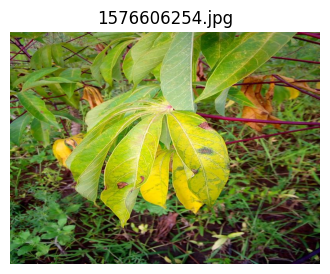

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step

=== Prediction Results ===
Predicted disease: CBB (Class 0)
Confidence: 68.63%

Detailed probabilities:
  CBB            : 68.63%
  CBSD           : 9.27%
  CGM            : 4.66%
  CMD            : 0.22%
  Healthy        : 17.22%

Options:
1. Predict from an image file
2. Exit
Enter your choice (1 or 2): 1

Enter the full path to the image file: /content/drive/MyDrive/cassava_dataset/train_images/1579761476.jpg


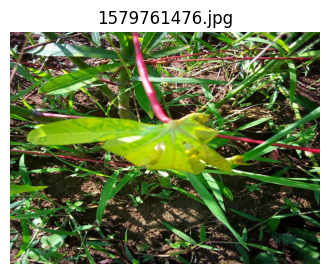

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

=== Prediction Results ===
Predicted disease: CBSD (Class 1)
Confidence: 65.20%

Detailed probabilities:
  CBB            : 6.01%
  CBSD           : 65.20%
  CGM            : 8.00%
  CMD            : 1.56%
  Healthy        : 19.24%

Options:
1. Predict from an image file
2. Exit
Enter your choice (1 or 2): 1

Enter the full path to the image file: /content/drive/MyDrive/cassava_dataset/train_images/1595577438.jpg


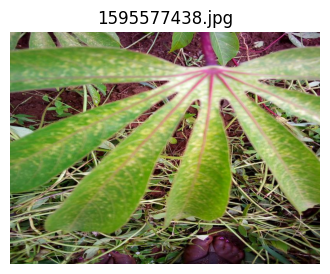

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step

=== Prediction Results ===
Predicted disease: CGM (Class 2)
Confidence: 99.81%

Detailed probabilities:
  CBB            : 0.00%
  CBSD           : 0.00%
  CGM            : 99.81%
  CMD            : 0.00%
  Healthy        : 0.19%

Options:
1. Predict from an image file
2. Exit
Enter your choice (1 or 2): 1

Enter the full path to the image file: /content/drive/MyDrive/cassava_dataset/train_images/1593622565.jpg


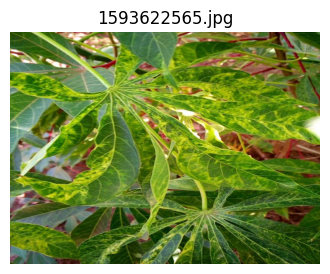

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

=== Prediction Results ===
Predicted disease: CMD (Class 3)
Confidence: 93.13%

Detailed probabilities:
  CBB            : 0.00%
  CBSD           : 1.70%
  CGM            : 4.11%
  CMD            : 93.13%
  Healthy        : 1.06%

Options:
1. Predict from an image file
2. Exit
Enter your choice (1 or 2): 1

Enter the full path to the image file: /content/drive/MyDrive/cassava_dataset/train_images/1595096662.jpg


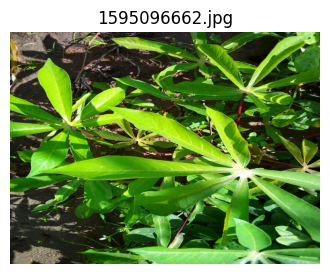

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step

=== Prediction Results ===
Predicted disease: Healthy (Class 4)
Confidence: 86.14%

Detailed probabilities:
  CBB            : 0.47%
  CBSD           : 3.52%
  CGM            : 8.96%
  CMD            : 0.91%
  Healthy        : 86.14%

Options:
1. Predict from an image file
2. Exit
Enter your choice (1 or 2): 2
Exiting program.


In [2]:
# User Interface for Cassava Disease Prediction
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from google.colab import drive

# Mount Google Drive (only needed in Colab)
drive.mount('/content/drive')

# Disease classification mapping
disease_names = {
    0: "CBB",    # Cassava Bacterial Blight
    1: "CBSD",   # Cassava Brown Streak Disease
    2: "CGM",    # Cassava Green Mottle
    3: "CMD",    # Cassava Mosaic Disease
    4: "Healthy"
}

# Model configuration
IMG_W, IMG_H = 150, 150

model_path = "/content/drive/MyDrive/cassava_cnn_balanced.h5"
#Loads the trained Keras model.
class CassavaDiseasePredictor:
    def __init__(self):
        """Initialize the predictor by loading the trained model"""
        try:
            self.model = load_model(model_path)
            print(f"Model loaded successfully from: {model_path}")
        except Exception as e:
            print(f"Error loading model: {e}")
            raise
#Loads the image from the given file path.
    def preprocess_image(self, image_path):
        """Load and preprocess an image for prediction"""
        try:
            img = Image.open(image_path).convert("RGB")
            img_resized = img.resize((IMG_W, IMG_H))
            x = np.array(img_resized, dtype=np.float32) / 255.0
            x = np.expand_dims(x, axis=0)  # Add batch dimension
            return x, img
        except Exception as e:
            print(f"Error processing image: {e}")
            return None, None

    def predict(self, image_path, show_image=True):
        """Make a prediction on a single image"""
        # Preprocess the image
        x, img = self.preprocess_image(image_path)
        if x is None:
            return None

        # Display the image if requested
        if show_image:
            plt.figure(figsize=(4,4))
            plt.imshow(np.array(img))
            plt.axis("off")
            plt.title(os.path.basename(image_path))
            plt.show()

        # Make prediction
        preds = self.model.predict(x)
        probs = preds[0]

        # Get top prediction
        top_index = np.argmax(probs) #Extracts the class with the highest predicted probability
        top_confidence = probs[top_index]

        # Prepare results
        results = {
            "top_class": disease_names[top_index],
            "class_number": int(top_index),
            "top_confidence": float(top_confidence),
            "all_probs": {disease_names[i]: float(p) for i, p in enumerate(probs)},
            "image": np.array(img)
        }

        return results

    def print_prediction_results(self, results):
        """Print the prediction results in a readable format"""
        if not results:
            print("No prediction results to display.")
            return

        print("\n=== Prediction Results ===")
        print(f"Predicted disease: {results['top_class']} (Class {results['class_number']})")
        print(f"Confidence: {results['top_confidence']:.2%}")
        print("\nDetailed probabilities:")
        for disease, prob in results['all_probs'].items():
            print(f"  {disease:<15}: {prob:.2%}")
        print("="*30)

def main():
    # Initialize the predictor
    try:
        predictor = CassavaDiseasePredictor()
    except:
        print("Failed to initialize predictor. Exiting.")
        return

    # Simple user interface
    print("\nCassava Leaf Disease Classifier")
    print("-------------------------------")

    while True:
        print("\nOptions:")
        print("1. Predict from an image file")
        print("2. Exit")

        choice = input("Enter your choice (1 or 2): ").strip()

        if choice == "1":
            # Get image path from user
            image_path = input("\nEnter the full path to the image file: ").strip()

            # Verify the file exists
            if not os.path.exists(image_path):
                print(f"Error: File not found at '{image_path}'")
                continue

            # Make and display prediction
            try:
                results = predictor.predict(image_path)
                if results:
                    predictor.print_prediction_results(results)
            except Exception as e:
                print(f"Error during prediction: {e}")

        elif choice == "2":
            print("Exiting program.")
            break

        else:
            print("Invalid choice. Please enter 1 or 2.")

if __name__ == "__main__":
    main()


# ***EfficientNet***

In [ ]:
# ========== INSTALL & IMPORTS ==========
!pip install torch torchvision torchaudio --quiet
!pip install scikit-learn seaborn --quiet

import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import torchvision.transforms as T
import torchvision.models as models

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

from google.colab import drive

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 62.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 34.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 83.7 MB/s eta 0:00:00


In [ ]:
# ========== CONFIG & MOUNT ==========
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

drive.mount('/content/drive', force_remount=True)
BASE = "/content/drive/MyDrive/cassava_dataset"
CSV  = os.path.join(BASE, "train.csv")
IMGDIR = os.path.join(BASE, "train_images")

assert os.path.exists(CSV), f"{CSV} not found!"
assert os.path.exists(IMGDIR), f"{IMGDIR} not found!"

# ========== LOAD & SPLIT DATA ==========
df = pd.read_csv(CSV)
df['label'] = df['label'].astype(int)

# Stratified split: 80% train_raw, 20% val_df
train_raw, val_df = train_test_split(
    df, test_size=0.2, stratify=df['label'], random_state=42
)

Using device: cpu
Mounted at /content/drive


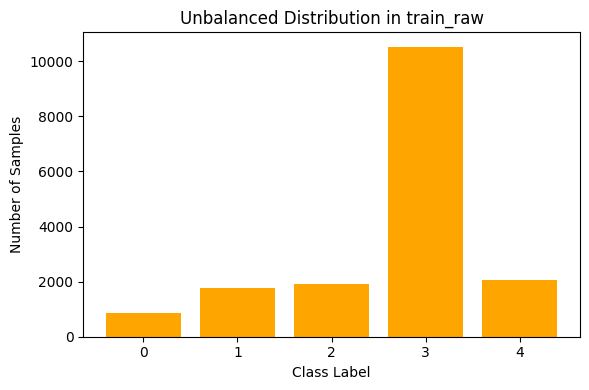

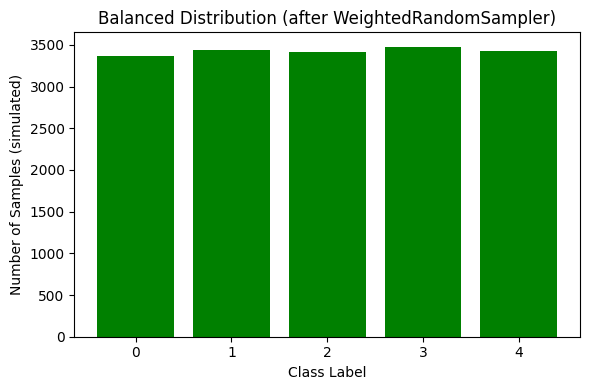

In [ ]:
# ========== PLOT UNBALANCED DISTRIBUTION ==========
counts_raw = train_raw['label'].value_counts().sort_index()
labels = [str(i) for i in counts_raw.index]
plt.figure(figsize=(6,4))
plt.bar(labels, counts_raw.values, color='orange')
plt.title("Unbalanced Distribution in train_raw")
plt.xlabel("Class Label")
plt.ylabel("Number of Samples")
plt.tight_layout()
plt.show()

# ========== PREPARE WEIGHTS FOR SAMPLING ==========
# Inverse frequency: weight = 1 / count
class_counts = train_raw['label'].value_counts().sort_index().to_dict()
class_weights = {cls: 1.0/count for cls, count in class_counts.items()}
sample_weights = [class_weights[label] for label in train_raw['label']]

# ========== PLOT DISTRIBUTION AFTER SAMPLING (SIMULATED) ==========
sampler_for_plot = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)
# sample indices for one epoch
idxs = list(iter(sampler_for_plot))
# map to labels
train_raw_reset = train_raw.reset_index(drop=True)
sampled_counts = train_raw_reset.iloc[idxs]['label'].value_counts().sort_index()

labels = [str(i) for i in sampled_counts.index]
plt.figure(figsize=(6,4))
plt.bar(labels, sampled_counts.values, color='green')
plt.title("Balanced Distribution (after WeightedRandomSampler)")
plt.xlabel("Class Label")
plt.ylabel("Number of Samples (simulated)")
plt.tight_layout()
plt.show()


Visualizing images before augmentation...


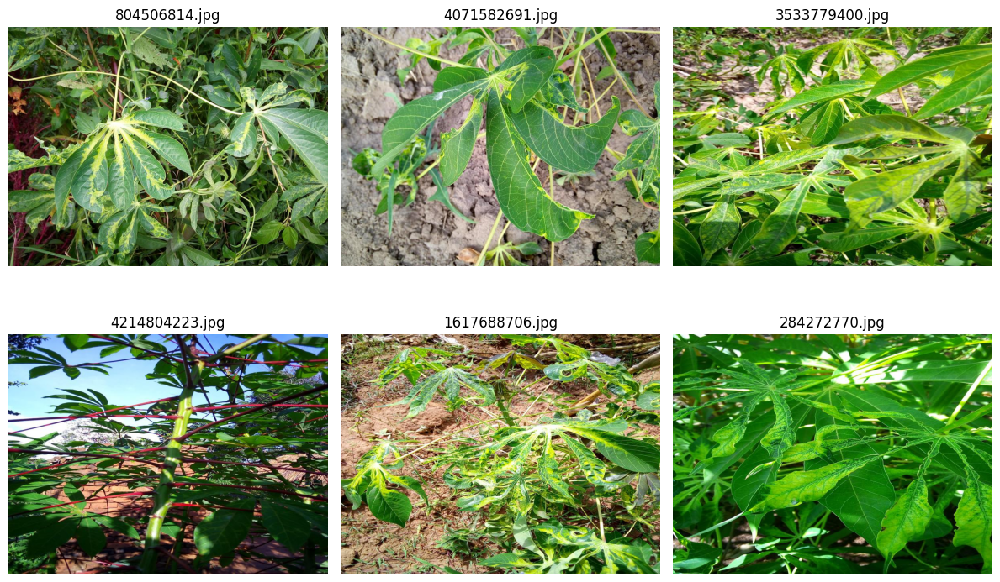

In [ ]:
#VISUALIZE IMAGES BEFORE AUGMENTATION
print("Visualizing images before augmentation...")

plt.figure(figsize=(12, 8))
sample_image_ids = train_raw['image_id'].sample(6, random_state=42).tolist() # Select 6 random image IDs

shown = 0
i = 0
while shown < len(sample_image_ids) and i < len(sample_image_ids):
    img_id = sample_image_ids[i]
    img_path = os.path.join(IMGDIR, img_id)

    if os.path.exists(img_path):
        try:
            img = Image.open(img_path).convert("RGB")
            plt.subplot(2, 3, shown + 1)
            plt.imshow(np.array(img))
            plt.title(img_id)
            plt.axis('off')
            shown += 1
        except Exception as e:
            print(f"Could not load image {img_id}: {e}")
    else:
        print(f"Image file not found: {img_path}")

    i += 1

plt.tight_layout()
plt.show()



In [ ]:

# ========== DEFINE TRANSFORMS & DATASET ==========
IMG_SIZE = 150


train_tf = T.Compose([
    T.RandomRotation(40), #  rotation range
    T.RandomResizedCrop(IMG_SIZE, scale=(0.7,1.0)), # randomly crops and resizes the image to introduce spatial variation.
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.1), # less frequently to retain biological realism
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1), # Randomly adjusts brightness, contrast, saturation, and hue to mimic lighting variations.
    T.ToTensor(), #Converts the image to a PyTorch tensor.
    T.Normalize(mean=[0.485,0.456,0.406],
                std=[0.229,0.224,0.225])
])

val_tf = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.456,0.406],
                std=[0.229,0.224,0.225])
])

class CassavaDataset(Dataset):
    def __init__(self, df, img_dir, transform):
        # Filter out rows where the image file does not exist
        self.df = df[df['image_id'].apply(lambda x: os.path.exists(os.path.join(img_dir, x)))].reset_index(drop=True)
        print(f"Original samples: {len(df)}, Filtered samples: {len(self.df)}")
        if len(self.df) == 0:
             raise ValueError("No valid images found after filtering DataFrame.")
        self.img_dir = img_dir
        self.tf = transform
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        # Use try-except for robustness during data loading
        try:
            img = Image.open(os.path.join(self.img_dir, row.image_id)).convert("RGB")
            return self.tf(img), row.label
        except Exception as e:
            print(f"Error loading or transforming image {row.image_id}: {e}")
                        raise

print("Checking for missing training images...")
initial_train_count = len(train_raw)
train_raw_filtered = train_raw[train_raw['image_id'].apply(lambda x: os.path.exists(os.path.join(IMGDIR, x)))].copy()
missing_train_count = initial_train_count - len(train_raw_filtered)
if missing_train_count > 0:
    print(f"Warning: Removed {missing_train_count} rows from train_raw due to missing image files.")
if len(train_raw_filtered) == 0:
     raise ValueError("No training images found after filtering.")

# Re-calculate sample weights based on the filtered data
class_counts_filtered = train_raw_filtered['label'].value_counts().sort_index().to_dict()
# Handle cases where a class might be completely removed
class_weights_filtered = {cls: 1.0/count if count > 0 else 0.0 for cls, count in class_counts_filtered.items()}
# Ensure sample weights are only for the filtered data
sample_weights_filtered = [class_weights_filtered[label] for label in train_raw_filtered['label']]


print("Checking for missing validation images...")
initial_val_count = len(val_df)
val_df_filtered = val_df[val_df['image_id'].apply(lambda x: os.path.exists(os.path.join(IMGDIR, x)))].copy()
missing_val_count = initial_val_count - len(val_df_filtered)
if missing_val_count > 0:
    print(f"Warning: Removed {missing_val_count} rows from val_df due to missing image files.")
if len(val_df_filtered) == 0:
     raise ValueError("No validation images found after filtering.")


train_ds = CassavaDataset(train_raw_filtered, IMGDIR, train_tf)
val_ds   = CassavaDataset(val_df_filtered,   IMGDIR, val_tf)


print("Data augmentation setup completed.")



Checking for missing training images...
Checking for missing validation images...
Original samples: 14342, Filtered samples: 14342
Original samples: 3596, Filtered samples: 3596
Data augmentation setup completed.


Visualizing same images after augmentation...


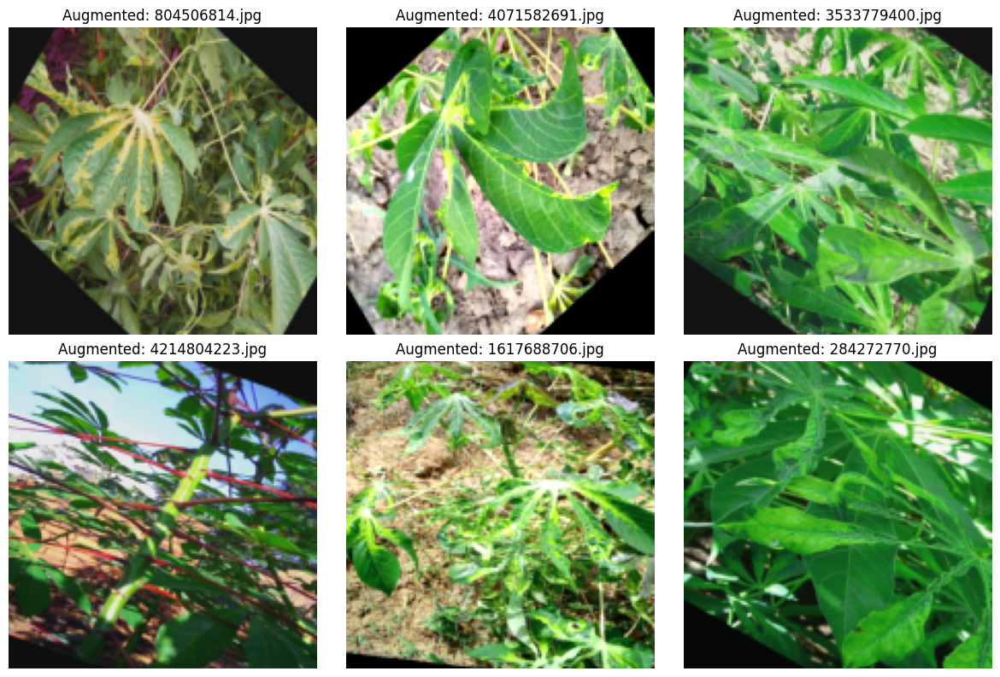

In [ ]:
# VISUALIZE SAME IMAGES AFTER AUGMENTATION
print("Visualizing same images after augmentation...")

# Select the same image IDs as before
sample_image_ids = train_raw['image_id'].sample(6, random_state=42).tolist()

plt.figure(figsize=(12, 8))
shown = 0
i = 0
while shown < len(sample_image_ids) and i < len(sample_image_ids):
    img_id = sample_image_ids[i]
    img_path = os.path.join(IMGDIR, img_id)

    if os.path.exists(img_path):
        try:
            # Load the original image
            img = Image.open(img_path).convert("RGB")

            # Apply the training transforms manually
            augmented_img_tensor = train_tf(img)

            # Denormalize and convert to numpy array for display
            augmented_img = augmented_img_tensor.permute(1, 2, 0).cpu().numpy()
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            augmented_img = std * augmented_img + mean
            augmented_img = np.clip(augmented_img, 0, 1)

            plt.subplot(2, 3, shown + 1)
            plt.imshow(augmented_img)
            plt.title(f"Augmented: {img_id}")
            plt.axis('off')
            shown += 1
        except Exception as e:
            print(f"Could not process or display augmented image {img_id}: {e}")
    else:
        print(f"Image file not found for augmentation: {img_path}")

    i += 1

plt.tight_layout()
plt.show()


In [ ]:
# ========== SAMPLER & DATALOADERS ==========
# Use the filtered sample weights
sampler = WeightedRandomSampler(
    weights=sample_weights_filtered,
    num_samples=len(sample_weights_filtered), # Number of samples should match the filtered dataset size
    replacement=True
)
train_loader = DataLoader(train_ds, batch_size=32, sampler=sampler, num_workers=2)
val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False,   num_workers=2) # Validation loader does not use sampler, but should use the filtered dataset



In [ ]:

# ========== BUILD & COMPILE EFFICIENTNETB0 ==========
!pip install torchsummary --quiet
from torchsummary import summary
model = models.efficientnet_b0(pretrained=True)
in_f = model.classifier[1].in_features

# Create a new classifier with Dropout and the final Linear layer
model.classifier = nn.Sequential(
    nn.Dropout(0.6),
    nn.Linear(in_f, 5)
)

model = model.to(device)

# Implement Label Smoothing Loss
class LabelSmoothingCrossEntropy(nn.Module):
    def __init__(self, epsilon: float = 0.1, reduction='mean'):
        super().__init__()
        self.epsilon = epsilon
        self.reduction = reduction

    def forward(self, inputs, targets):
        targets = targets.long()
        # Number of classes
        C = inputs.shape[1]
        # Calculate log probabilities
        log_preds = F.log_softmax(inputs, dim=-1)
        # NLL loss (without smoothing)
        nll_loss = F.nll_loss(log_preds, targets, reduction=self.reduction)
        smooth_targets = torch.zeros_like(log_preds).scatter_(1, targets.unsqueeze(1), 1.0)
        smooth_targets = smooth_targets * (1.0 - self.epsilon) + self.epsilon / C
        kl_loss = F.kl_div(log_preds, smooth_targets, reduction=self.reduction, log_target=False)

        # Combine losses
        if self.reduction == 'mean':
            return nll_loss + kl_loss
        elif self.reduction == 'sum':
            return nll_loss + kl_loss * inputs.shape[0]
        else: # none
            return nll_loss + kl_loss


import torch.nn.functional as F

criterion = LabelSmoothingCrossEntropy(epsilon=0.1)
optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-2)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.3, patience=7, verbose=True
)
# Simple Early Stopping callback
class SimpleEarlyStopping:
    def __init__(self, patience=7, min_delta=0.001, mode='min'):
        self.patience = patience
        self.min_delta = min_delta
        self.mode = mode
        self.counter = 0
        self.best_value = None
        self.early_stop = False

        if mode == 'min':
            self.min_delta *= -1 # For minimization, improvement is a decrease
        elif mode == 'max':
            pass # For maximization, improvement is an increase
        else:
            raise ValueError("Mode must be 'min' or 'max'")

    def __call__(self, current_value):
        if self.best_value is None:
            self.best_value = current_value
        elif (self.mode == 'min' and current_value > self.best_value - self.min_delta) or \
             (self.mode == 'max' and current_value < self.best_value + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_value = current_value
            self.counter = 0

# Instantiate the Early Stopping callback, monitoring validation loss
early_stopping = SimpleEarlyStopping(patience=10, min_delta=0.0005, mode='min')
summary(model, (3, 150, 150)) # Print model summary

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 75, 75]             864
       BatchNorm2d-2           [-1, 32, 75, 75]              64
              SiLU-3           [-1, 32, 75, 75]               0
            Conv2d-4           [-1, 32, 75, 75]             288
       BatchNorm2d-5           [-1, 32, 75, 75]              64
              SiLU-6           [-1, 32, 75, 75]               0
 AdaptiveAvgPool2d-7             [-1, 32, 1, 1]               0
            Conv2d-8              [-1, 8, 1, 1]             264
              SiLU-9              [-1, 8, 1, 1]               0
           Conv2d-10             [-1, 32, 1, 1]             288
          Sigmoid-11             [-1, 32, 1, 1]               0
SqueezeExcitation-12           [-1, 32, 75, 75]               0
           Conv2d-13           [-1, 16, 75, 75]             512
      BatchNorm2d-14           [-1, 16,

In [ ]:
# ========== TRAINING LOOP ==========
best_acc = 0.0
history = {'train_loss': [], 'val_loss': [], 'val_acc': []}

for epoch in range(1, 51):
    # Training
    model.train()
    running_loss = 0.0
    # The DataLoader now uses the filtered dataset, so no FileNotFoundError should occur
    for X, y in train_loader:
        X, y = X.to(device), y.to(device)
        optimizer.zero_grad()
        out = model(X)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    train_loss = running_loss / len(train_loader) # Calculate average loss per batch
    history['train_loss'].append(train_loss)

    # Validation
    model.eval()
    val_loss = 0.0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for X, y in val_loader:
            X, y = X.to(device), y.to(device)
            out = model(X)
            loss = criterion(out, y)
            val_loss += loss.item() # Calculate sum of batch losses
            preds = out.argmax(dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(y.cpu().numpy())
    val_loss /= len(val_loader) # Calculate average loss per batch
    val_acc = np.mean(np.array(all_preds) == np.array(all_labels))
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)

    scheduler.step(val_loss)
    print(f"Epoch {epoch:02d} | train_loss={train_loss:.4f} | val_loss={val_loss:.4f} | val_acc={val_acc:.4f}")

    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(model.state_dict(), "best_efficientnet_pytorch.pth")
        print("↳ Saved new best model")

print("Best Validation Accuracy:", best_acc)


Epoch 01 | train_loss=0.9427 | val_loss=0.7031 | val_acc=0.7684
↳ Saved new best model
Epoch 02 | train_loss=0.7319 | val_loss=0.7013 | val_acc=0.7558
Epoch 03 | train_loss=0.6402 | val_loss=0.5421 | val_acc=0.8192
↳ Saved new best model
Epoch 04 | train_loss=0.5878 | val_loss=0.7922 | val_acc=0.7158
Epoch 05 | train_loss=0.5250 | val_loss=0.7277 | val_acc=0.7614
Epoch 06 | train_loss=0.4873 | val_loss=0.7168 | val_acc=0.7608
Epoch 07 | train_loss=0.4509 | val_loss=0.5943 | val_acc=0.8095
Epoch 08 | train_loss=0.2961 | val_loss=0.6098 | val_acc=0.8206
↳ Saved new best model
Epoch 09 | train_loss=0.2320 | val_loss=0.6865 | val_acc=0.8098
Epoch 10 | train_loss=0.2112 | val_loss=0.7238 | val_acc=0.8131
Epoch 11 | train_loss=0.1865 | val_loss=0.7279 | val_acc=0.8120
Epoch 12 | train_loss=0.1500 | val_loss=0.7442 | val_acc=0.8151
Epoch 13 | train_loss=0.1230 | val_loss=0.7797 | val_acc=0.8167
Epoch 14 | train_loss=0.1140 | val_loss=0.8188 | val_acc=0.8006
Epoch 15 | train_loss=0.1064 | val_

In [ ]:
from google.colab import drive
import os
import torch

# Mount Google Drive
drive.mount('/content/drive')

# Define save path in Google Drive
save_path = '/content/drive/MyDrive/best_efficientnet_pytorch.pth'

# Create directory if it doesn't exist
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save the model
torch.save(model.state_dict(), save_path)
print(f"Model saved to Google Drive at: {save_path}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model saved to Google Drive at: /content/drive/MyDrive/best_efficientnet_pytorch.pth


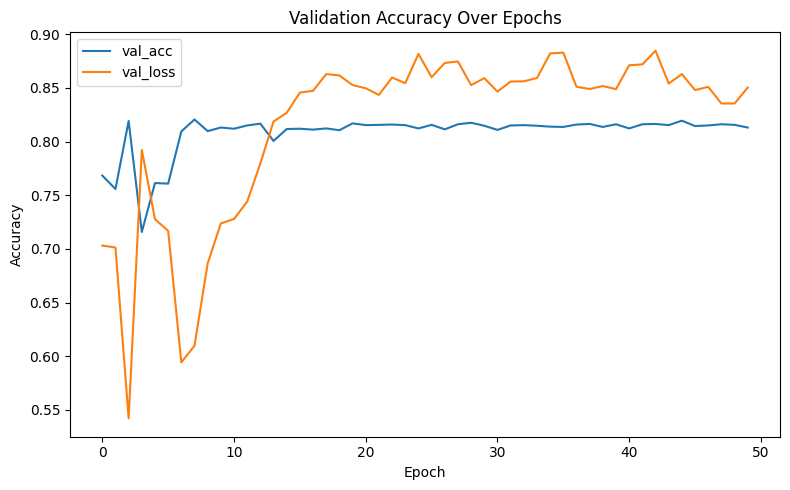

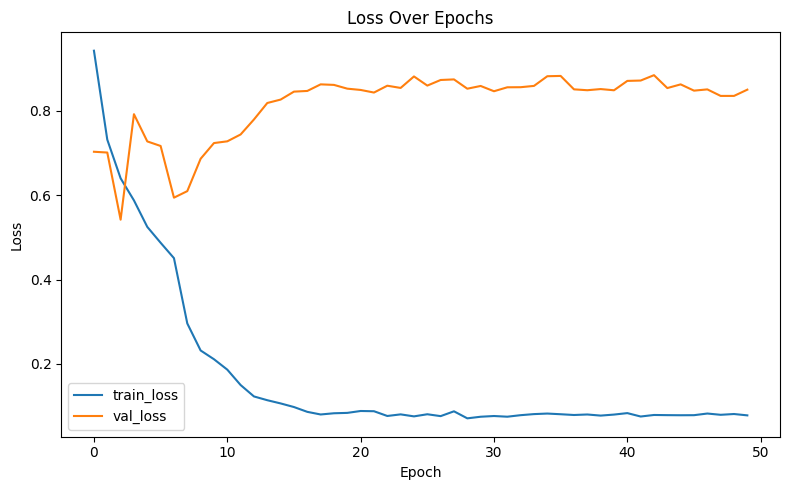

In [ ]:
# ========== PLOT TRAINING METRICS ==========

plt.figure(figsize=(8,5))
plt.plot(history['val_acc'], label='val_acc')
plt.plot(history['val_loss'], label='val_loss')
plt.title("Validation Accuracy Over Epochs")
plt.xlabel("Epoch"); plt.ylabel("Accuracy")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(8,5))
plt.plot(history['train_loss'], label='train_loss')
plt.plot(history['val_loss'],   label='val_loss')
plt.title("Loss Over Epochs")
plt.xlabel("Epoch"); plt.ylabel("Loss")
plt.legend(); plt.tight_layout(); plt.show()


Classification Report:
               precision    recall  f1-score   support

         CBB     0.5160    0.6789    0.5864       190
        CBSD     0.7464    0.7096    0.7275       365
         CGM     0.5142    0.8005    0.6262       406
         CMD     0.9585    0.8701    0.9121      2201
     Healthy     0.6667    0.5668    0.6127       434

    accuracy                         0.7992      3596
   macro avg     0.6804    0.7252    0.6930      3596
weighted avg     0.8282    0.7992    0.8078      3596



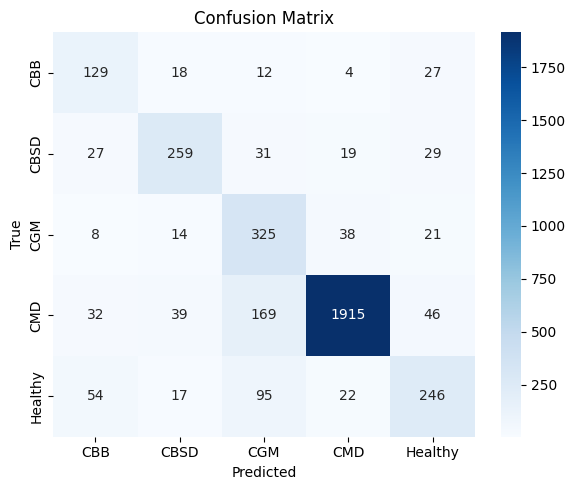

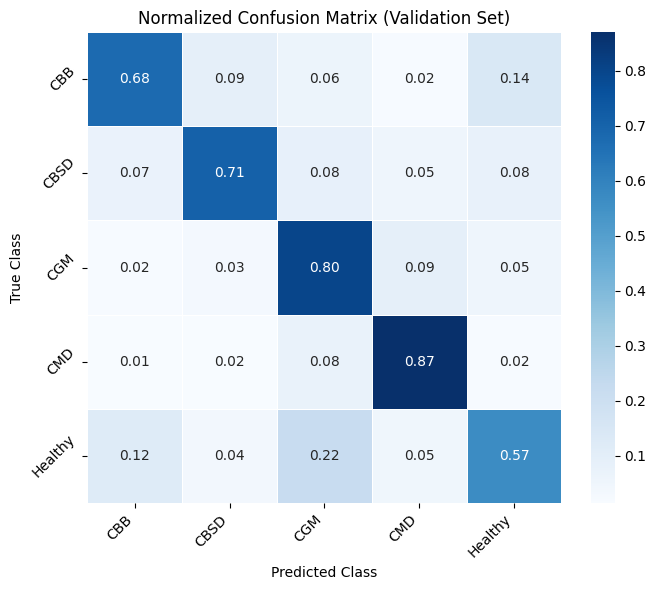

In [ ]:
# ========== EVALUATION & METRICS ==========
# Load best model weights
model.load_state_dict(torch.load("best_efficientnet_pytorch.pth"))
model.eval()

all_preds, all_labels = [], []
with torch.no_grad():
    # Use the filtered validation loader
    for X, y in val_loader:
        X = X.to(device)
        out = model(X)
        preds = out.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
       all_labels.extend(y.cpu().numpy())

label_map = {0:"CBB",1:"CBSD",2:"CGM",3:"CMD",4:"Healthy"}

print("\nClassification Report:\n",
      classification_report(all_labels, all_preds,
                            target_names=list(label_map.values()), digits=4))

# Calculate the confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# Plot the non-normalized confusion matrix
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=list(label_map.values()),
            yticklabels=list(label_map.values()))
plt.xlabel("Predicted"); plt.ylabel("True")
plt.title("Confusion Matrix"); plt.tight_layout(); plt.show()

# Normalize the confusion matrix
# Divide each row by the sum of the row to get percentages within each true class
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot the normalized confusion matrix
plt.figure(figsize=(7,6))
sns.heatmap(
    cm_normalized,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    xticklabels=list(label_map.values()),
    yticklabels=list(label_map.values()),
    linewidths=0.5
)
plt.ylabel("True Class")
plt.xlabel("Predicted Class")
plt.title("Normalized Confusion Matrix (Validation Set)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

Mounted at /content/drive


Model loaded successfully

Cassava Leaf Disease Classifier
-------------------------------

Options:
1. Predict from an image file
2. Exit
Enter your choice (1 or 2): 1

Enter the full path to the image file: /content/drive/MyDrive/cassava_dataset/train_images/1576606254.jpg


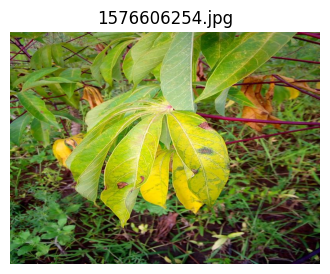

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step

=== Prediction Results ===
Predicted disease: CBB (Class 0)
Confidence: 68.63%

Detailed probabilities:
  CBB            : 68.63%
  CBSD           : 9.27%
  CGM            : 4.66%
  CMD            : 0.22%
  Healthy        : 17.22%

Options:
1. Predict from an image file
2. Exit
Enter your choice (1 or 2): 1

Enter the full path to the image file: /content/drive/MyDrive/cassava_dataset/train_images/1579761476.jpg


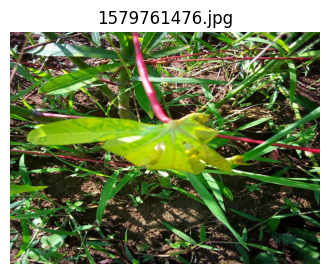

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

=== Prediction Results ===
Predicted disease: CBSD (Class 1)
Confidence: 65.20%

Detailed probabilities:
  CBB            : 6.01%
  CBSD           : 65.20%
  CGM            : 8.00%
  CMD            : 1.56%
  Healthy        : 19.24%

Options:
1. Predict from an image file
2. Exit
Enter your choice (1 or 2): 1

Enter the full path to the image file: /content/drive/MyDrive/cassava_dataset/train_images/1595577438.jpg


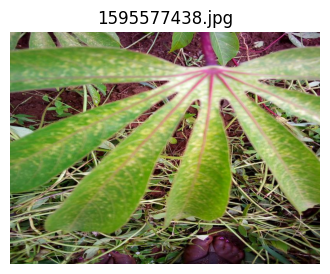

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

=== Prediction Results ===
Predicted disease: CGM (Class 2)
Confidence: 99.81%

Detailed probabilities:
  CBB            : 0.00%
  CBSD           : 0.00%
  CGM            : 99.81%
  CMD            : 0.00%
  Healthy        : 0.19%

Options:
1. Predict from an image file
2. Exit
Enter your choice (1 or 2): 1

Enter the full path to the image file: /content/drive/MyDrive/cassava_dataset/train_images/1593622565.jpg


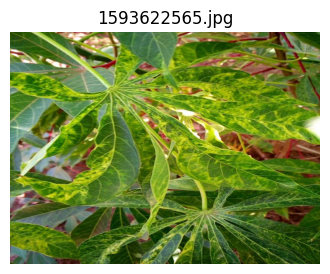

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

=== Prediction Results ===
Predicted disease: CMD (Class 3)
Confidence: 93.13%

Detailed probabilities:
  CBB            : 0.00%
  CBSD           : 1.70%
  CGM            : 4.11%
  CMD            : 93.13%
  Healthy        : 1.06%

Options:
1. Predict from an image file
2. Exit
Enter your choice (1 or 2): 1

Enter the full path to the image file: /content/drive/MyDrive/cassava_dataset/train_images/1595096662.jpg


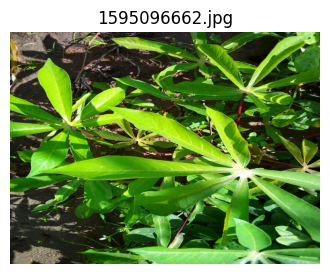

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

=== Prediction Results ===
Predicted disease: Healthy (Class 4)
Confidence: 86.14%

Detailed probabilities:
  CBB            : 0.47%
  CBSD           : 3.52%
  CGM            : 8.96%
  CMD            : 0.91%
  Healthy        : 86.14%

Options:
1. Predict from an image file
2. Exit
Enter your choice (1 or 2): 2
Exiting program.


In [ ]:
# User Interface for Cassava Disease Prediction
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from google.colab import drive

# Mount Google Drive (only needed in Colab)
drive.mount('/content/drive')

# Disease classification mapping
disease_names = {
    0: "CBB",    # Cassava Bacterial Blight
    1: "CBSD",   # Cassava Brown Streak Disease
    2: "CGM",    # Cassava Green Mottle
    3: "CMD",    # Cassava Mosaic Disease
    4: "Healthy"
}

# Model configuration
IMG_W, IMG_H = 150, 150

model_path = "/content/drive/MyDrive/best_efficientnet_pytorch.pth"

class CassavaDiseasePredictor:
    def __init__(self):
        """Initialize the predictor by loading the trained model"""
        try:
            self.model = load_model(model_path)
            print(f"Model loaded successfully")
        except Exception as e:
            print(f"Error loading model: {e}")
            raise

    def preprocess_image(self, image_path):
        """Load and preprocess an image for prediction"""
        try:
            img = Image.open(image_path).convert("RGB")
            img_resized = img.resize((IMG_W, IMG_H))
            x = np.array(img_resized, dtype=np.float32) / 255.0
            x = np.expand_dims(x, axis=0)  # Add batch dimension
            return x, img
        except Exception as e:
            print(f"Error processing image: {e}")
            return None, None

    def predict(self, image_path, show_image=True):
        """Make a prediction on a single image"""
        # Preprocess the image
        x, img = self.preprocess_image(image_path)
        if x is None:
            return None

        # Display the image if requested
        if show_image:
            plt.figure(figsize=(4,4))
            plt.imshow(np.array(img))
            plt.axis("off")
            plt.title(os.path.basename(image_path))
            plt.show()

        # Make prediction
        preds = self.model.predict(x)
        probs = preds[0]

        # Get top prediction
        top_index = np.argmax(probs)
        top_confidence = probs[top_index]

        # Prepare results
        results = {
            "top_class": disease_names[top_index],
            "class_number": int(top_index),
            "top_confidence": float(top_confidence),
            "all_probs": {disease_names[i]: float(p) for i, p in enumerate(probs)},
            "image": np.array(img)
        }

        return results

    def print_prediction_results(self, results):
        """Print the prediction results in a readable format"""
        if not results:
            print("No prediction results to display.")
            return

        print("\n=== Prediction Results ===")
        print(f"Predicted disease: {results['top_class']} (Class {results['class_number']})")
        print(f"Confidence: {results['top_confidence']:.2%}")
        print("\nDetailed probabilities:")
        for disease, prob in results['all_probs'].items():
            print(f"  {disease:<15}: {prob:.2%}")
        print("="*30)

def main():
    # Initialize the predictor
    try:
        predictor = CassavaDiseasePredictor()
    except:
        print("Failed to initialize predictor. Exiting.")
        return

    # Simple user interface
    print("\nCassava Leaf Disease Classifier")
    print("-------------------------------")

    while True:
        print("\nOptions:")
        print("1. Predict from an image file")
        print("2. Exit")

        choice = input("Enter your choice (1 or 2): ").strip()

        if choice == "1":
            # Get image path from user
            image_path = input("\nEnter the full path to the image file: ").strip()

            # Verify the file exists
            if not os.path.exists(image_path):
                print(f"Error: File not found at '{image_path}'")
                continue

            # Make and display prediction
            try:
                results = predictor.predict(image_path)
                if results:
                    predictor.print_prediction_results(results)
            except Exception as e:
                print(f"Error during prediction: {e}")

        elif choice == "2":
            print("Exiting program.")
            break

        else:
            print("Invalid choice. Please enter 1 or 2.")

if __name__ == "__main__":
    main()


# ***ResNet***

In [ ]:
# ========== INSTALL & IMPORTS ==========
!pip install torch torchvision torchaudio --quiet
!pip install scikit-learn seaborn --quiet
!pip install torchsummary --quiet

import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR, ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import torchvision.transforms as T
import torchvision.models as models
from torchsummary import summary

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

from google.colab import drive

In [ ]:

# ========== CONFIG & MOUNT ==========
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

drive.mount('/content/drive', force_remount=True)
BASE   = "/content/drive/MyDrive/cassava_dataset"
CSV    = os.path.join(BASE, "train.csv")
IMGDIR = os.path.join(BASE, "train_images")

assert os.path.isfile(CSV), f"{CSV} not found!"
assert os.path.isdir(IMGDIR), f"{IMGDIR} not found!"

Using device: cpu
Mounted at /content/drive


In [ ]:

# ========== LOAD & SPLIT DATA ==========
df = pd.read_csv(CSV)
df['label'] = df['label'].astype(int)

train_raw, val_df = train_test_split(
    df, test_size=0.20, stratify=df['label'], random_state=42
)

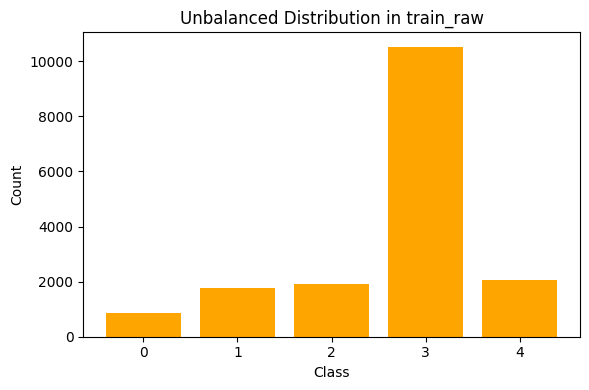

In [ ]:
# ========== PLOT UNBALANCED DISTRIBUTION ==========
plt.figure(figsize=(6,4))
counts_raw = train_raw['label'].value_counts().sort_index()
plt.bar(counts_raw.index.astype(str), counts_raw.values, color='orange')
plt.title("Unbalanced Distribution in train_raw")
plt.xlabel("Class")
plt.ylabel("Count")
plt.tight_layout(); plt.show()

In [ ]:
train_raw = train_raw[train_raw['image_id'].apply(lambda fn: os.path.isfile(os.path.join(IMGDIR, fn)))].reset_index(drop=True)
val_df    = val_df[   val_df['image_id'].apply(lambda fn: os.path.isfile(os.path.join(IMGDIR, fn)))].reset_index(drop=True)


In [ ]:
# ========== SET UP SAMPLER FOR BALANCING ==========
cls_counts    = train_raw['label'].value_counts().sort_index()
class_weights = {cls: 1.0/count for cls, count in cls_counts.items()}
sample_weights = train_raw['label'].map(class_weights).values
sampler = WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)

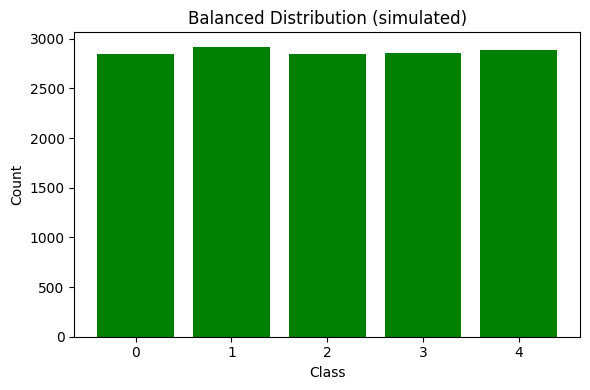

In [ ]:


# ========== PLOT SIMULATED BALANCED DISTRIBUTION ==========
idxs = list(iter(sampler))
sim_counts = train_raw.iloc[idxs]['label'].value_counts().sort_index()
plt.figure(figsize=(6,4))
plt.bar(sim_counts.index.astype(str), sim_counts.values, color='green')
plt.title("Balanced Distribution (simulated)")
plt.xlabel("Class")
plt.ylabel("Count")
plt.tight_layout(); plt.show()

Visualizing images before augmentation...


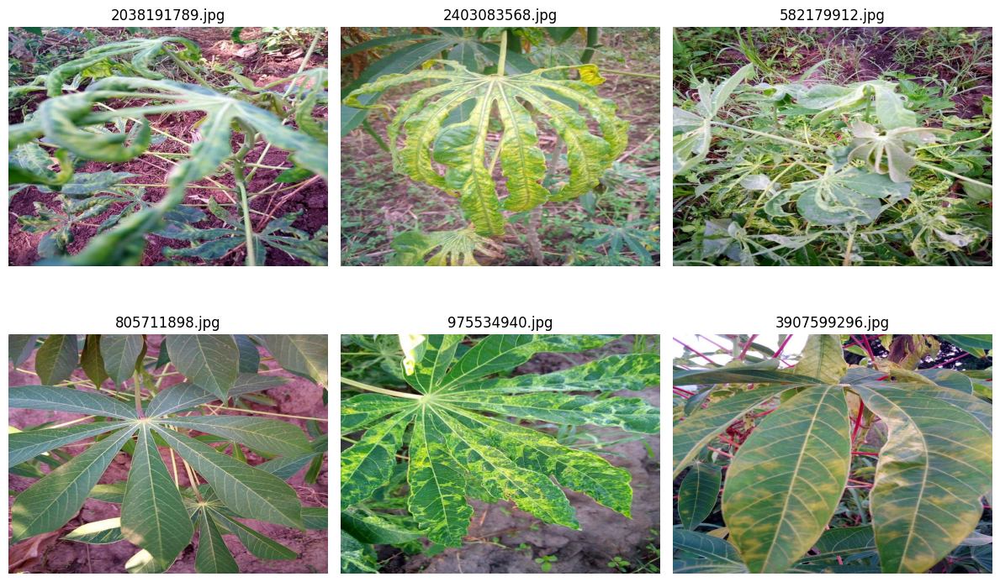

In [ ]:
#VISUALIZE IMAGES BEFORE AUGMENTATION
print("Visualizing images before augmentation...")

plt.figure(figsize=(12, 8))
sample_image_ids = train_raw['image_id'].sample(6, random_state=42).tolist() # Select 6 random image IDs

shown = 0
i = 0
while shown < len(sample_image_ids) and i < len(sample_image_ids):
    img_id = sample_image_ids[i]
    img_path = os.path.join(IMGDIR, img_id)

    if os.path.exists(img_path):
        try:
            img = Image.open(img_path).convert("RGB")
            plt.subplot(2, 3, shown + 1)
            plt.imshow(np.array(img))
            plt.title(img_id)
            plt.axis('off')
            shown += 1
        except Exception as e:
            print(f"Could not load image {img_id}: {e}")
    else:
        print(f"Image file not found: {img_path}")

    i += 1

plt.tight_layout()
plt.show()

#

In [ ]:
# ========== TRANSFORMS & DATASET ==========
IMG_SIZE = 150

train_tf = T.Compose([
    T.RandomResizedCrop(IMG_SIZE, scale=(0.8,1.0)),
    T.RandomHorizontalFlip(),
    T.RandomApply([T.ColorJitter(0.4,0.4,0.4,0.1)], p=0.8),
    T.ToTensor(), # Move ToTensor before RandomErasing
    T.RandomErasing(p=0.5, scale=(0.02,0.2)), # Apply RandomErasing after ToTensor
    T.Normalize(mean=[0.485,0.456,0.406],
                std=[0.229,0.224,0.225])
])

val_tf = T.Compose([
    T.Resize((IMG_SIZE,IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=[0.485,0.456,0.406],
                std=[0.229,0.224,0.225])
])

class CassavaDataset(Dataset):
    def __init__(self, df, img_dir, transform):
        self.df      = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.tf      = transform
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        path = os.path.join(self.img_dir, row.image_id)
        img  = Image.open(path).convert("RGB")
        return self.tf(img), row.label

train_ds = CassavaDataset(train_raw, IMGDIR, train_tf)
val_ds   = CassavaDataset(val_df,    IMGDIR, val_tf)

train_loader = DataLoader(train_ds, batch_size=32, sampler=sampler, num_workers=2)
val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False,    num_workers=2)

Visualizing same images after augmentation...


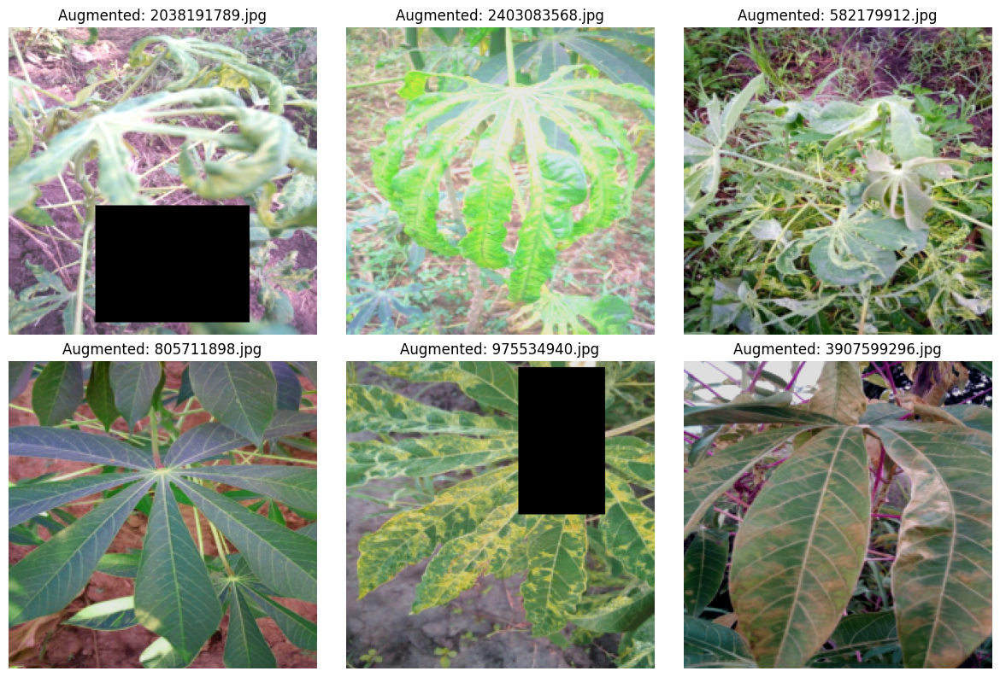

In [ ]:
# VISUALIZE SAME IMAGES AFTER AUGMENTATION
print("Visualizing same images after augmentation...")

# Select the same image IDs as before
sample_image_ids = train_raw['image_id'].sample(6, random_state=42).tolist()

plt.figure(figsize=(12, 8))
shown = 0
i = 0
while shown < len(sample_image_ids) and i < len(sample_image_ids):
    img_id = sample_image_ids[i]
    img_path = os.path.join(IMGDIR, img_id)

    if os.path.exists(img_path):
        try:
            # Load the original image
            img = Image.open(img_path).convert("RGB")

            # Apply the training transforms manually
            augmented_img_tensor = train_tf(img)

            # Denormalize and convert to numpy array for display
            augmented_img = augmented_img_tensor.permute(1, 2, 0).cpu().numpy()
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            augmented_img = std * augmented_img + mean
            augmented_img = np.clip(augmented_img, 0, 1)

            plt.subplot(2, 3, shown + 1)
            plt.imshow(augmented_img)
            plt.title(f"Augmented: {img_id}")
            plt.axis('off')
            shown += 1
        except Exception as e:
            print(f"Could not process or display augmented image {img_id}: {e}")
    else:
        print(f"Image file not found for augmentation: {img_path}")

    i += 1

plt.tight_layout()
plt.show()


In [ ]:
# ========== BUILD & CONFIGURE RESNET50 ==========
model = models.resnet50(pretrained=True) # skip layer connection

# Freeze all layers first
for param in model.parameters():
    param.requires_grad = False

# Replace classifier head with Dropout + Linear
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout(p=0.5),
    nn.Linear(num_ftrs, 5)
)

model = model.to(device)

# Loss with label smoothing
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

# Optimizer with weight decay
optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-3,
    weight_decay=1e-2
)

# Scheduler: OneCycleLR for stage 1
scheduler = OneCycleLR(
    optimizer,
    max_lr=1e-3,
    steps_per_epoch=len(train_loader),
    epochs=5,
    pct_start=0.3,
    anneal_strategy='cos'
)


# Print model summary
summary(model, (3, 150, 150))

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:02<00:00, 45.2MB/s]


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
# ========== TRAINING LOOP: STAGE 1 (HEAD ONLY) ==========
# Initialize history with train_acc
history = {'train_loss':[], 'val_loss':[], 'val_acc':[], 'train_acc':[]}
best_acc = 0.0

for epoch in range(1, 6):
    model.train()
    running_loss = 0.0
    correct_preds = 0
    total_preds = 0
    for X,y in train_loader:
        X,y = X.to(device), y.to(device)
        optimizer.zero_grad()
        out = model(X)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()
        scheduler.step()

        running_loss += loss.item()*X.size(0)
        # Calculate training accuracy
        _, predicted = torch.max(out.data, 1)
        total_preds += y.size(0)
        correct_preds += (predicted == y).sum().item()

    train_loss = running_loss/len(train_loader.dataset)
    train_acc = correct_preds / total_preds # Calculate training accuracy

    model.eval()
    running_v, preds, labels = 0.0, [], []
    with torch.no_grad():
        for X,y in val_loader:
            X,y = X.to(device), y.to(device)
            out = model(X)
            running_v += criterion(out,y).item()*X.size(0)
            preds.extend(out.argmax(1).cpu().numpy())
            labels.extend(y.cpu().numpy())
    val_loss = running_v/len(val_loader.dataset)
    val_acc  = np.mean(np.array(preds)==np.array(labels))

    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['train_acc'].append(train_acc) # Append training accuracy

    print(f"[Stage1] Epoch {epoch} | train_loss={train_loss:.4f} | train_acc={train_acc:.4f} | val_loss={val_loss:.4f} | val_acc={val_acc:.4f}")

    if val_acc>best_acc:
        best_acc=val_acc
        torch.save(model.state_dict(),"best_resnet50_stage1.pth")

# ========== STAGE 2: UNFREEZE LAYER4 & FINE-TUNE ==========
for name,param in model.named_parameters():
    if "layer4" in name or "fc" in name:
        param.requires_grad = True

optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-3,
    weight_decay=1e-2
)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

for epoch in range(6, 11):
    model.train()
    running_loss = 0.0
    correct_preds = 0
    total_preds = 0
    for X,y in train_loader:
        X,y = X.to(device), y.to(device)
        optimizer.zero_grad()
        out = model(X)
        loss = criterion(out,y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()*X.size(0)
        # Calculate training accuracy
        _, predicted = torch.max(out.data, 1)
        total_preds += y.size(0)
        correct_preds += (predicted == y).sum().item()

    train_loss = running_loss/len(train_loader.dataset)
    train_acc = correct_preds / total_preds # Calculate training accuracy

    model.eval()
    running_v, preds, labels = 0.0, [], []
    with torch.no_grad():
        for X,y in val_loader:
            X,y = X.to(device), y.to(device)
            out = model(X)
            running_v += criterion(out,y).item()*X.size(0)
            preds.extend(out.argmax(1).cpu().numpy())
            labels.extend(y.cpu().numpy())
    val_loss = running_v/len(val_loader.dataset)
    val_acc  = np.mean(np.array(preds)==np.array(labels))

    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['train_acc'].append(train_acc) # Append training accuracy


    scheduler.step(val_loss)
    print(f"[Stage2] Epoch {epoch} | train_loss={train_loss:.4f} | train_acc={train_acc:.4f} | val_loss={val_loss:.4f} | val_acc={val_acc:.4f}")


    if val_acc>best_acc:
        best_acc=val_acc
        torch.save(model.state_dict(),"best_resnet50_stage2.pth")

print("Best Validation Accuracy:", best_acc)


[Stage1] Epoch 1 | train_loss=1.4949 | train_acc=0.3576 | val_loss=1.1819 | val_acc=0.6110
[Stage1] Epoch 2 | train_loss=1.3429 | train_acc=0.4859 | val_loss=1.0193 | val_acc=0.6846
[Stage1] Epoch 3 | train_loss=1.3347 | train_acc=0.5008 | val_loss=1.1461 | val_acc=0.6318
[Stage1] Epoch 4 | train_loss=1.3068 | train_acc=0.5141 | val_loss=1.0749 | val_acc=0.6557
[Stage1] Epoch 5 | train_loss=1.2727 | train_acc=0.5247 | val_loss=1.0731 | val_acc=0.6666


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


[Stage2] Epoch 6 | train_loss=1.1380 | train_acc=0.6206 | val_loss=0.9109 | val_acc=0.7600
[Stage2] Epoch 7 | train_loss=0.9698 | train_acc=0.7169 | val_loss=0.8879 | val_acc=0.7795
[Stage2] Epoch 8 | train_loss=0.8763 | train_acc=0.7640 | val_loss=0.9122 | val_acc=0.7558
[Stage2] Epoch 9 | train_loss=0.8199 | train_acc=0.7954 | val_loss=0.9213 | val_acc=0.7525
[Stage2] Epoch 10 | train_loss=0.7588 | train_acc=0.8316 | val_loss=0.8572 | val_acc=0.7862
Best Validation Accuracy: 0.7861512791991101


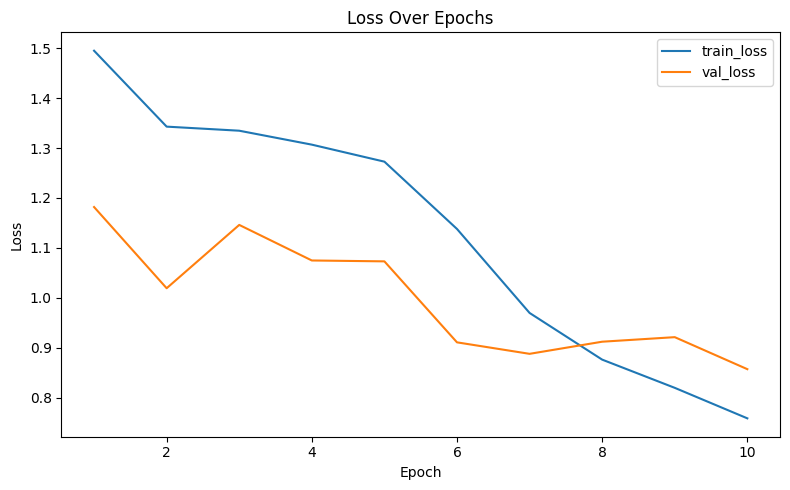

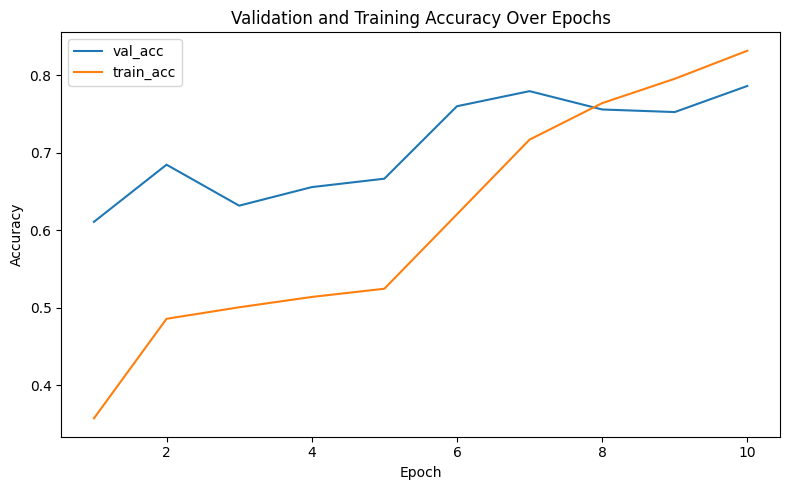

In [ ]:
# ========== PLOT TRAINING METRICS ==========
epochs = list(range(1,11))
plt.figure(figsize=(8,5))
plt.plot(epochs, history['train_loss'], label='train_loss')
plt.plot(epochs, history['val_loss'],   label='val_loss')
plt.title("Loss Over Epochs"); plt.xlabel("Epoch"); plt.ylabel("Loss")
plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(8,5))
plt.plot(epochs, history['val_acc'], label='val_acc')
# Plot train_acc as it's now available in history
plt.plot(epochs, history['train_acc'], label='train_acc')
plt.title("Validation and Training Accuracy Over Epochs"); plt.xlabel("Epoch"); plt.ylabel("Accuracy")
plt.legend(); plt.tight_layout(); plt.show()

<ipython-input-33-35ed98cb0ee7>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_resnet50_stage2.pth"))



Classification Report:
               precision    recall  f1-score   support

         CBB     0.4298    0.5158    0.4689       190
        CBSD     0.6472    0.6986    0.6719       365
         CGM     0.6838    0.6552    0.6692       406
         CMD     0.9581    0.8632    0.9082      2201
     Healthy     0.5116    0.7097    0.5946       434

    accuracy                         0.7862      3596
   macro avg     0.6461    0.6885    0.6626      3596
weighted avg     0.8138    0.7862    0.7962      3596



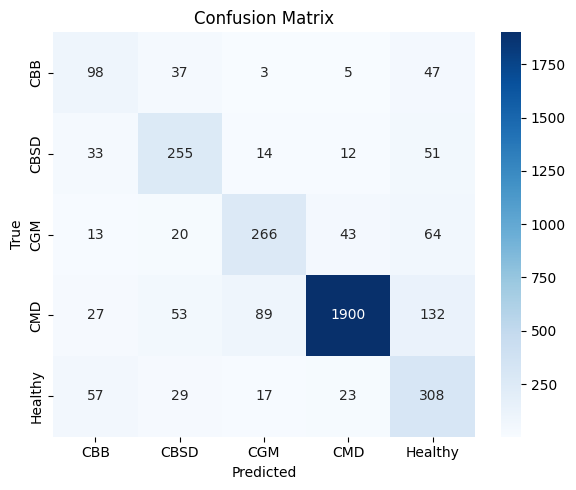

In [ ]:
# ========== EVALUATION ==========
model.load_state_dict(torch.load("best_resnet50_stage2.pth"))
model.eval()

all_preds, all_labels = [], []
with torch.no_grad():
    for X,y in val_loader:
        X = X.to(device)
        out = model(X)
        all_preds.extend(out.argmax(1).cpu().numpy())
        all_labels.extend(y.cpu().numpy())

label_map = {0:"CBB",1:"CBSD",2:"CGM",3:"CMD",4:"Healthy"}
print("\nClassification Report:\n",
      classification_report(all_labels, all_preds, target_names=list(label_map.values()), digits=4))

cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=list(label_map.values()),
            yticklabels=list(label_map.values()))
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Confusion Matrix"); plt.tight_layout(); plt.show()

/tmp/ipython-input-32-119171355.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Model', y='Validation Accuracy', data=accuracy_df, palette='viridis')


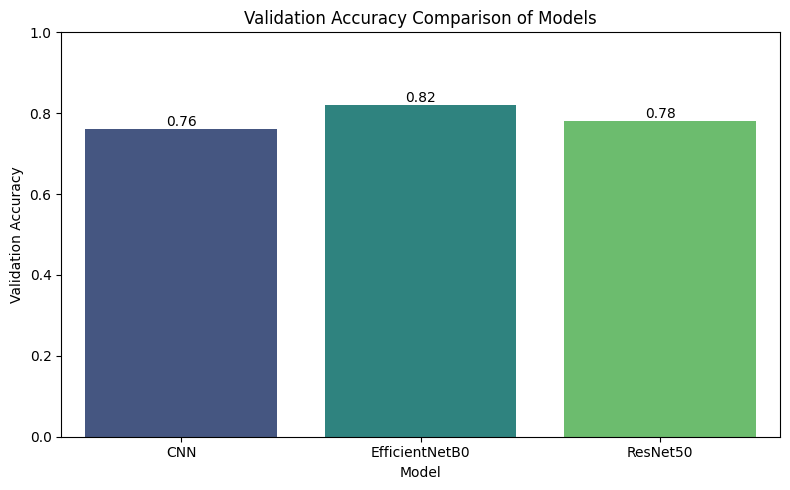

            Model  Validation Accuracy
0             CNN                 0.76
1  EfficientNetB0                 0.82
2        ResNet50                 0.78


In [ ]:
#Comparison

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Extract Validation Accuracies
cnn_accuracy = 0.76
efficientnet_accuracy = 0.82
resnet50_accuracy = 0.78


# 2. Create a Pandas DataFrame
data = {'Model': ['CNN', 'EfficientNetB0', 'ResNet50'],
        'Validation Accuracy': [cnn_accuracy, efficientnet_accuracy, resnet50_accuracy]}
accuracy_df = pd.DataFrame(data)

# 3. Plot the Bar Graph
plt.figure(figsize=(8, 5))
ax = sns.barplot(x='Model', y='Validation Accuracy', data=accuracy_df, palette='viridis')
plt.title('Validation Accuracy Comparison of Models')
plt.ylabel('Validation Accuracy')
plt.ylim(0, 1) # Set y-axis limit from 0 to 1 for better comparison

# Add the accuracy values on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.tight_layout()
plt.show()

# print the DataFrame for a quick look at the values
print(accuracy_df)